In [1]:
# define packages
using Plots, NLSolvers, DifferentialEquations, Plots.PlotMeasures, LaTeXStrings, Roots, NLsolve

In [2]:
# define constants
const V0 = 3. # the value has to be taken from the figure 1
const N = 400 # number of x points
const L_real_turing = 0.05 # total length also non-dimensional point (l/re)
const L_real_waves = 0.015
const c = 1.82;
const Vr = 3;
const dt = 0.05;   # adimensional time step 

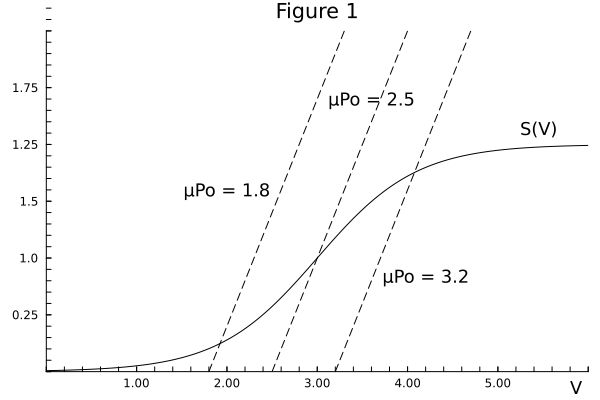

Solution for V0[1]: 1.9235627757679878
Solution for V0[1]: 2.9999999913758333
Solution for V0[1]: 4.07643722760594


In [3]:
######## FIGURE 1 #########

V=0:0.01:6   #range of membrane potentials
S=1 ./(1 .+exp.(-c.*(V.-Vr)))  #sigmoid function

a_e=6 
a_i=5
brok_li_1=1.8
brok_li_2=2.5
brok_li_3=3.2
y_1= V.*(1.5)./1.5.+brok_li_1  #equation of the first broken line
y_2= V.*(1.5)./1.5.+brok_li_2  #equation of the second broken line
y_3= V.*(1.5)./1.5.+brok_li_3  #equation of the third broken line

# Plot Figure 1
p=plot( y_1, V, linestyle=:dash, color=:black, xlims=(0, 6), ylims=(0, 1.5), grid=false, legend=false,title="Figure 1") 

plot!(y_2, V, linestyle=:dash, color=:black)
plot!(y_3, V, linestyle=:dash, color=:black)
plot!(V, S, color=:black)

plot!(
    xticks=(
        vcat(0:1:6, 0:0.2:6),                
        vcat(["", "1.00", "2.00", "3.00", "4.00", "5.00", " "], repeat("", 30)) 
    ),
    yticks=(
        vcat(0:0.25:2, 0:0.05:2), 
        vcat(["", "0.25", "1.0", "1.5", "1.25", "1.75", " "], repeat("", 30))  
    ),
    
)

annotate!(5.8, -0.07, text("V", :left, 12))
annotate!(2, 0.8, text("µPo = 1.8", :black, 12))  
annotate!(3.6, 1.2, text("µPo = 2.5", :black, 12))
annotate!(4.2, 0.42, text("µPo = 3.2", :black, 12))
annotate!(5.45, 1.07, text("S(V)", :black, 12))

display(p)

# Define the non linear equation as a function
function equation(V)
    V[1] - (a_e - a_i) * (1 / (1 + exp(-c * (V[1] - Vr)))) -µ_Po
end


# Solve 
µ_Po=1.8
result = nlsolve(equation, [0.5])  
println("Solution for V0[1]: ", result.zero[1])

µ_Po=2.5
result = nlsolve(equation, [0.5])
println("Solution for V0[1]: ", result.zero[1])

µ_Po=3.2
result = nlsolve(equation, [0.5])
println("Solution for V0[1]: ", result.zero[1])

   

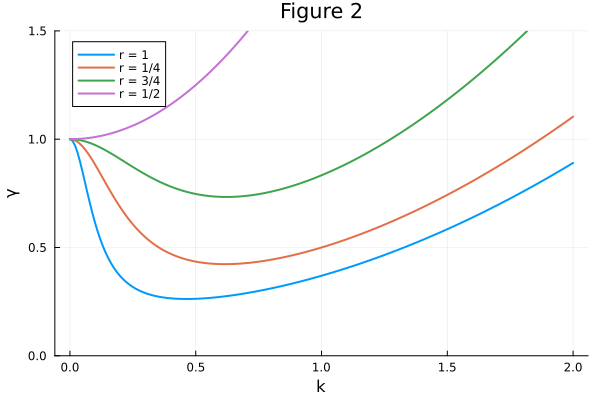

In [4]:
######## FIGURE 2 #########

γ_c(k, r, ae, ai) = (r^2 + (1 + r^2) * k^2 + k^4) / ((ae - ai) * r^2 + (ae - ai * r^2) * k^2)

r_range = [1/4,1/2, 3/4, 1]
k = 0:0.01:2.0
ae = 6
ai = 5

plot(k, [γ_c.(k, r, ae, ai) for r in r_range], ylim = (0,1.5), label = ["r = 1" "r = 1/4" "r = 3/4" "r = 1/2"], xlabel = 'k', ylabel = 'γ', lw = 2,
legend = :topleft, title="Figure 2")

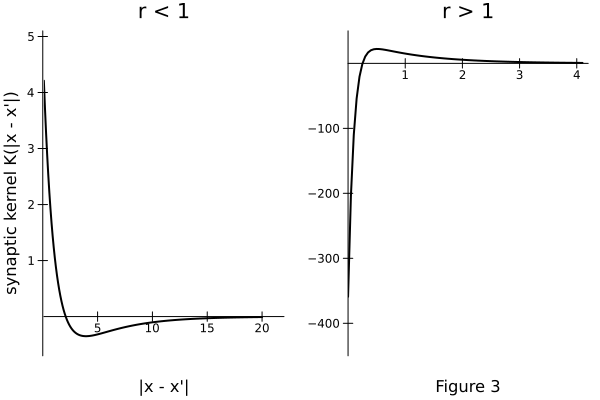

In [5]:
######## FIGURE 3 #########

# Define a function for the synaptic kernel K(|x - x'|)
# r = re/ri
function synaptic_kernel(x, ae, ai, r)
    ex = exp.(-x)            
    return ae .* ex - ai .* r .* (ex .^ r)  
end

# r < 1
x1 = 0.:0.1:20.               # Define x range
ae1, ai1, r1 = 6., 5., 0.25   # Parameters
K1 = synaptic_kernel(x1, ae1, ai1, r1)
plot1 = plot(
    x1, K1,
    xlabel="|x - x'|", ylabel="synaptic kernel K(|x - x'|)",
    title="r < 1", color=:black, lw=2, grid=false, legend=false,
    xlims=(0.1, 22), ylims=(-0.7, 5.1), framestyle=:origin
)

# r > 1
x2 = 0.:0.05:4.1              # Define x range
ae2, ai2, r2 = 41., 40., 10.  # Parameters
K2 = synaptic_kernel(x2, ae2, ai2, r2)
plot2 = plot(
    x2, K2, legend=false, xlabel="Figure 3",
    title="r > 1", color=:black, lw=2, grid=false,
    xlims=(0, 4.2), ylims=(-450, 50), framestyle=:origin
)

plot(plot1, plot2, layout=(1, 2))

In [6]:
######## Main Code - Figure 7, 8, 9, 10, 11 ########

# define functions

function sigmoid(V_mat)  # compute the sigmoid function for each value of the input matrix. The output has the same size of the input.
    return 1 ./ (1 .+ exp.(-c .* (V_mat.-Vr)))
end

const G0 = 2 .* sigmoid(V0*ones(1,N+1)) # precompute the value of G when the time is negative

function G(V,nt,n,du,v) # compute the G. V is the whole matrix, nt is the current iteration and n is the index of the spatial-temporal delay
    nx = 0:N  # vector of the index in the x axis
    timedelayed = nt*dt .- (n.*du./v)   # delay in adimensional seconds
    ntdelayed = Int64(round(timedelayed / dt))   # delay in terms of indexes
    if ntdelayed < 1
        return G0    # if the time is negative return the precomputed value
    else
        G1 = sigmoid(V[ntdelayed,mod1.((nx.-n.+1),N+1)])  # compute the G for the two different (opposite) delays
        G2 = sigmoid(V[ntdelayed,((nx.+n).%(N+1).+1)])    # circular shift with the indexes
        return permutedims(G1.+G2)
    end      
end

function integral_function(V,nt,eta,du,v,c1,c2,c3,GG)    # compute the I
    b = (1/eta).*(GG[1,:] .+(GG[2,:] .-GG[1,:])./(eta.*du)); 
    K = c2.*(GG[N+1,:].+(GG[N+1,:].-GG[N,:])./(eta.*du)); 
    cc = zeros(N+1,N-1)
    for nn = 1:N-1
        cc[:,nn] = c3[nn].*(GG[nn+2,:] .-2 .*GG[nn+1,:] .+ GG[nn,:]);   # compute the sum
    end 
    summ = sum(cc,dims=2)
    return c1.*summ .+ b .- K
end

function J_function(V,nt,eta,du,v,ae,ai,c1,c2,c3,GG)    # compute the J
    J_e = ae.*eta[1].*integral_function(V,nt,eta[1],du,v,c1[1],c2[1],c3[:,1],GG);
    J_i = ai.*eta[2].*integral_function(V,nt,eta[2],du,v,c1[2],c2[2],c3[:,2],GG);
    return 0.5 .* (J_e .- J_i) 
end

function brainPatterns(V,eta,du,v,ae,ai,muP,N_t) 
    ########################################
    # main function of the code:
    # V : matrix that has to be initialized outside the function, with N+1 columns and N_t rows. The first row has to be V0 + gaussian noise
    # eta : vector that must contain the excitatory eta as first value and the inhibitory as second.
    # du : spatial step (value)
    # v : propagation velocity (value)
    # ae : excitatory interaction strenght (value)
    # ai : inhibitory interaction strenght (value)
    # muP : external interaction. Has to be a matrix with the same size of V
    # N_t : length of the time vector
    ########################################
    
    # define matrixes used 
    J=zeros(size(V)); phi = zeros(size(V));
    # compute constant parameters that do not depend on the nt
    c1 = 1 ./ ((eta.^2).*du);
    c2 = (1 ./eta).*exp.(-eta.*L)
    nn = 0:N-2; c3 = exp.(-eta.*((nn.+1).*du))
    # main iteration cycle
    for nt = 1:N_t-1
        # iteration check
        if nt%1000 == 0
            display(nt)
        end
        # precompute G function for the current nt. horizontal dimension: space. vertical dimension: delay (n)
        GG = zeros(N+1,N+1)
        for nn = 0:N
            GG[nn+1,:] = G(V,nt,nn,du,v)
        end
        # update the matrixes
        J[nt,:] = J_function(V,nt,eta,du,v,ae,ai,c1,c2,c3,GG);
        V[nt+1,:] = V[nt,:] .+ dt.*phi[nt,:]
        phi[nt+1,:] = phi[nt,:] .+ dt.*(-2 .*phi[nt,:] .- V[nt,:] .+ J[nt,:] .+ muP[nt,:])
    end
    return V,J,phi
end

brainPatterns (generic function with 1 method)

In [7]:
# matrix V initialization
# precompute perturbation so it is the same for every figure

V_perturb = V0.*ones(1,N+1) .+ 0.0005 .*randn(1,N+1);

# external stimulus
muP0_val = 2.5;

In [8]:
######## Turing Patterns (FIG. 7) ########
# parameters
ae = 6.;     # excitatory strenght
ai = 5.;     # inhibitory strenght
re = 0.0005;    # excitatory range (m)
ri = 0.001;     # inhibitory range (m)
r = re/ri;   # ratio

v_real = 0.08; # propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_turing / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 1200
t = 0:dt:T
N_t = length(t);

In [9]:
# main cycle fig. 7
# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V[1,:] = V_perturb

# initialize the external stimulation
muP0 = muP0_val*ones(size(V))

# compute the pattern
@time begin
V7,J7 = brainPatterns(V,eta,du,v,ae,ai,muP0,N_t);
end

1000

2000

3000

4000

5000

6000

7000

8000

9000

10000

11000

12000

13000

14000

15000

16000

17000

18000

19000

20000

21000

22000

23000

24000

301.681506 seconds (158.44 M allocations: 522.322 GiB, 11.74% gc time, 1.05% compilation time)


([3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; 3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; … ; 3.0123352938583383 2.913733639731751 … 3.2048698253112673 3.110474886341971; 3.0123118818062125 2.913710313515623 … 3.204848539167039 3.1104521773068905], [0.5000521184348998 0.4998934138338913 … 0.49999289462487795 0.5001366610943592; 0.5000521184348998 0.4998934138338913 … 0.49999289462487795 0.5001366610943592; … ; 0.5113943079701779 0.41279620959169927 … 0.7040142220924466 0.6095621019100794; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -1.2029079279485267e-5 2.4600384913120445e-5 … 1.6399402322786472e-6 -3.1541764819476016e-5; … ; -0.00046824104252089847 -0.00046652432255742614 … -0.00042572288456628086 -0.00045418070160669884; -0.00046846623267682096 -0.0004667433973042584 … -0.00042593075705068433 -0.00045440185304059785])

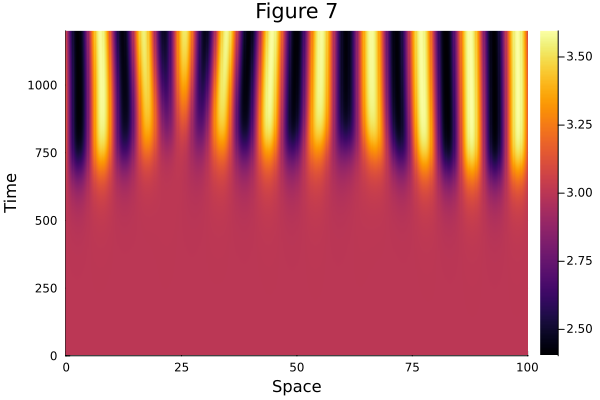

In [10]:
# display the pattern
heatmap(x, t, V7; xlabel="Space", ylabel="Time", title="Figure 7")

In [25]:
######## Waves - homogeneous stimulus - close to the threshold (FIG. 8) ########

ae = 41;     # excitatory strenght
ai = 40;     # inhibitory strenght
re = 0.001;    # excitatory range (m)
ri = 0.00037;     # inhibitory range (m)
r = re/ri;   # ratio

v_real = 0.16;# propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 400 #adimensional time
t = 0:dt:T
N_t = length(t);

In [12]:
# main cycle - fig 8

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V[1,:] = V_perturb

# initialize the external stimulation
muP0 = muP0_val*ones(size(V))

# compute the pattern
@time begin
V8,J8 = brainPatterns(V,eta,du,v,ae,ai,muP0,N_t);
end

1000

2000

3000

4000

5000

6000

7000

8000

 98.734242 seconds (54.02 M allocations: 178.160 GiB, 12.76% gc time, 0.80% compilation time)


([3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; 3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; … ; 3.2673699591588923 3.273357443371154 … 3.2548011001115906 3.26118579498166; 3.3423160504026574 3.3481948976163634 … 3.329959331964839 3.3362386840877347], [0.4998337793647565 0.5003208381852637 … 0.5000155351479627 0.4995743209260155; 0.4998337793647565 0.5003208381852637 … 0.5000155351479627 0.4995743209260155; … ; 2.4678637693273515 2.445753355726037 … 2.513681908697958 2.490497284528116; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -2.294603278665264e-5 4.5971602481742485e-5 … 2.771966386516667e-6 -5.965877323665936e-5; … ; 1.4989218248752993 1.4967490849041918 … 1.5031646370649678 1.5010577821215014; 1.4340543328961923 1.4306939720315168 … 1.4407922137877893 1.437417578386674])

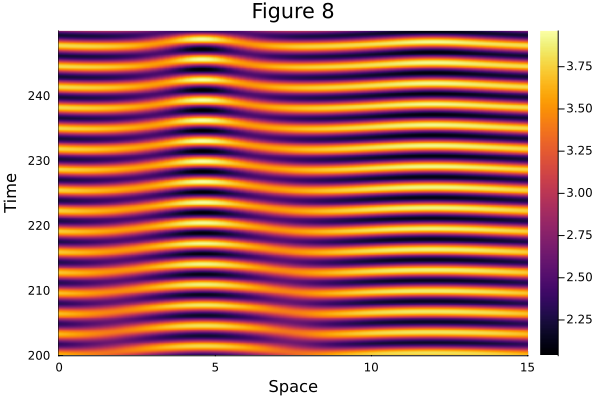

In [27]:
heatmap(x,t[4000:5000],V8[4000:5000,:]; xlabel="Space", ylabel="Time", title="Figure 8")


In [31]:
######## FIGURE 9 ########
# Waves - Homogeneous external stimulation - Well above threshold

re = 0.001;       # excitatory range (m)
ri = 0.0001;
ai = 100.;
ae = 101.;
r = re/ri;   # ratio

v_real = 0.16; # propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 200
t = 0:dt:T
N_t = length(t);

In [15]:
# main cycle - fig 9

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V[1,:] = V_perturb

# initialize the external stimulation
muP0 = muP0_val*ones(size(V))

# compute the pattern
@time begin
V9,J9 = brainPatterns(V,eta,du,v,ae,ai,muP0,N_t);
end

1000

2000

3000

4000

 53.307103 seconds (26.07 M allocations: 87.393 GiB, 12.82% gc time)


([3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; 3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; … ; 3.6891779834311835 3.7830292318813887 … 3.509043706523343 3.597748139987317; 4.416256941360574 4.507762853821117 … 4.239562693906114 4.326749638642889], [0.4980214773191207 0.5039991889275584 … 0.5002521804897526 0.49483712328245133; 0.4980214773191207 0.5039991889275584 … 0.5002521804897526 0.49483712328245133; … ; 21.158267462271077 19.950430614171704 … 23.393996698017393 22.30635869827125; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -0.00011356113506844068 0.00022988913959647307 … 1.4604233476012142e-5 -0.000296518655414868; … ; 14.541579158587817 14.494672438794566 … 14.610379747655427 14.580029973111436; 14.08587571667103 13.978575264029626 … 14.268589422464586 14.18245750371449])

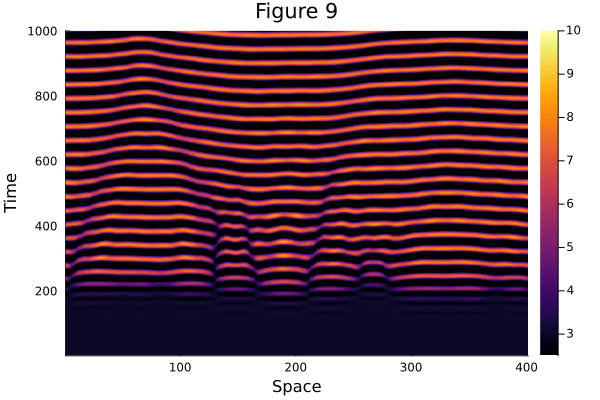

In [34]:
heatmap(V9[1:1000,:]; clim=(2.5,10),xlabel="Space", ylabel="Time", title="Figure 9")

In [17]:
######## FIGURE 10 ########
# Waves - inhomogeneous stimulus - close to the threshold

ae = 41;     # excitatory strenght
ai = 40;     # inhibitory strenght
re = 0.001;    # excitatory range (m)
ri = 0.00037;     # inhibitory range (m)
r = re/ri;   # ratio

v_real = 0.16;# propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re;
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 200
t = 0:dt:T
N_t = length(t);

In [18]:
# main cycle - fig 10

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V[1,:] = V_perturb

# initialize and define inhomogeneous external stimuli 
muP = muP0_val*ones(size(V))
x1 = Int64(round((0.475*L)/(du)))+1;
x2 = Int64(round((0.525*L)/(du)))+1;
t1 = Int64(49/dt)+1;
t2 = Int64(130/dt)+1;
for i = x1:x2
    #muP[:,i] = muP[:,i] .+ 20;
    muP[t1:t2,i] = muP[t1:t2,i] .+ 20;
end

# compute the pattern
@time begin
V10,J10 = brainPatterns(V,eta,du,v,ae,ai,muP,N_t);
end

1000

2000

3000

4000

 50.797783 seconds (26.06 M allocations: 87.393 GiB, 13.15% gc time)


([3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; 3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; … ; 2.7874609400439625 2.792961541165852 … 2.793393181956694 2.787604032933592; 2.7534204580901354 2.7585261634047615 … 2.758902570640839 2.7535451254207843], [0.4998337793647565 0.5003208381852637 … 0.5000155351479627 0.4995743209260155; 0.4998337793647565 0.5003208381852637 … 0.5000155351479627 0.4995743209260155; … ; 0.6331744191226498 0.6097059171859165 … 0.6056274342493602 0.6318126910565631; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -2.294603278665264e-5 4.5971602481742485e-5 … 2.771966386516667e-6 -5.965877323665936e-5; … ; -0.6808096390765392 -0.6887075552218132 … -0.6898122263171036 -0.6811781502561473; -0.595443001214951 -0.6039995808986286 … -0.6052192910707599 -0.595849902324384])

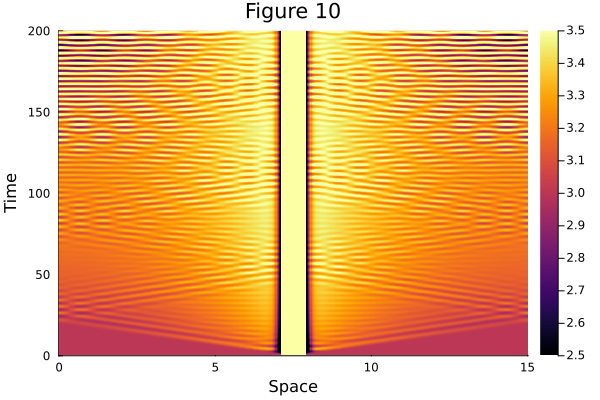

In [19]:
heatmap(x,t,V10; clim=(2.5,3.5),xlabel="Space", ylabel="Time", title="Figure 10")

In [20]:
######## FIGURE 11 ########
# Waves - Homogeneous external stimulation - Well above threshold
re = 0.001;       # excitatory range (m)
ri = 0.0001;
ai = 100.;
ae = 101.;
r = re/ri;   # ratio

v_real = 0.16; # propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 200
t = 0:dt:T
N_t = length(t);

In [35]:
# main cycle - fig 11

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V[1,:] = V_perturb

# initialize and define inhomogeneous external stimuli 
muP = muP0_val*ones(size(V))
x1 = Int64(round((0.475*L)/(du)))+1;
x2 = Int64(round((0.525*L)/(du)))+1;
t1 = Int64(49/dt)+1;
t2 = Int64(130/dt)+1;

for i = 100:200 # space indexes
    muP[300:350,i] = muP[300:350,i] .+ 20; # time indexes
end


@time begin
    V11,J11 = brainPatterns(V,eta,du,v,ae,ai,muP,N_t);
end

1000

2000

3000

4000

 47.578493 seconds (26.07 M allocations: 87.393 GiB, 13.81% gc time)


([3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; 3.0002927000204895 2.999401406135629 … 2.9999600958202324 3.0007674963907487; … ; 1.4462371784742225 1.3441219342089132 … 1.6642876425543283 1.553434212207195; 2.1114176220147853 2.005142926745084 … 2.3384960611693972 2.2230192047230126], [0.4980214773191207 0.5039991889275584 … 0.5002521804897526 0.49483712328245133; 0.4980214773191207 0.5039991889275584 … 0.5002521804897526 0.49483712328245133; … ; 38.2561447495109 38.52603436367089 … 37.61856895174953 37.95487246043487; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -0.00011356113506844068 0.00022988913959647307 … 1.4604233476012142e-5 -0.000296518655414868; … ; 13.303608870811255 13.220419850723411 … 13.484168372301376 13.391699850316353; 13.938743362281963 13.88247348712417 … 14.058465600531 13.997601777696103])

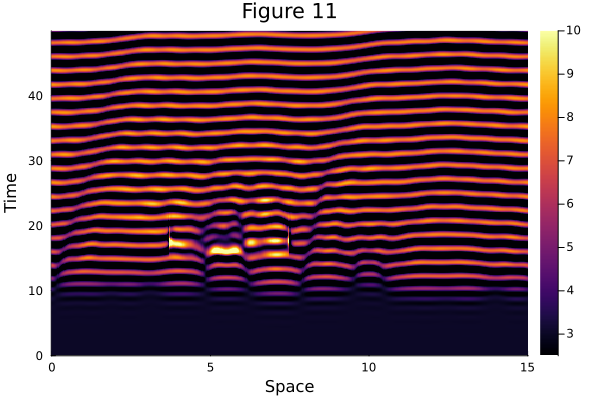

In [38]:
heatmap(x,t[1:1000],V11[1:1000,:]; clim=(2.5,10), xlabel="Space", ylabel="Time",title="Figure 11")